# Wines Points prediction 

In [1]:
%load_ext autoreload
%autoreload 2
import sys; sys.path.append('../')

Here we will try to predict the points a wine will get based on known characteristics (i.e. features, in the ML terminology). The mine point in this stage is to establish a simple, ideally super cost effective, basline.
In the real world there is a tradeoff between complexity and perforamnce, and the DS job, among others, is to present a tradeoff tables of what performance is achivalbel at what complexity level. 

to which models with increased complexity and resource demands will be compared. Complexity should then be translated into cost. For example:
 * Compute cost 
 * Maintenance cost
 * Serving costs (i.e. is new platform needed?) 
 

## Loading the data

In [161]:
import pandas as pd
import numpy as np
import plotly.express as px 
import ipywidgets as widgets
#import cufflinks as cf; cf.go_offline()

In [162]:
wine_reviews = pd.read_csv("C:/Users/user/Documents/GitHub/Python_ML_2023/data/winemag-data-130k-v2.csv")
wine_reviews = pd.read_csv("../data/winemag-data-130k-v2.csv")
wine_reviews=wine_reviews.drop(columns=['Unnamed: 0'])
print(wine_reviews.shape)
WR=wine_reviews 
WR.head()

(129971, 13)


,country,description,designation,points,price,province,region_1,region_2,taster_name,taster_twitter_handle,title,variety,winery
0,Italy,"Aromas include tropical fruit, broom, brimston...",Vulkà Bianco,87,NaN,Sicily & Sardinia,Etna,NaN,Kerin O’Keefe,@kerinokeefe,Nicosia 2013 Vulkà Bianco (Etna),White Blend,Nicosia
1,Portugal,"This is ripe and fruity, a wine that is smooth...",Avidagos,87,15.0,Douro,NaN,NaN,Roger Voss,@vossroger,Quinta dos Avidagos 2011 Avidagos Red (Douro),Portuguese Red,Quinta dos Avidagos
2,US,"Tart and snappy, the flavors of lime flesh and...",NaN,87,14.0,Oregon,Willamette Valley,Willamette Valley,Paul Gregutt,@paulgwine,Rainstorm 2013 Pinot Gris (Willamette Valley),Pinot Gris,Rainstorm
3,US,"Pineapple rind, lemon pith and orange blossom ...",Reserve Late Harvest,87,13.0,Michigan,Lake Michigan Shore,NaN,Alexander Peartree,NaN,St. Julian 2013 Reserve Late Harvest Riesling ...,Riesling,St. Julian
4,US,"Much like the regular bottling from 2012, this...",Vintner's Reserve Wild Child Block,87,65.0,Oregon,Willamette Valley,Willamette Valley,Paul Gregutt,@paulgwine,Sweet Cheeks 2012 Vintner's Reserve Wild Child...,Pinot Noir,Sweet Cheeks


## add columns of  vintage

In [165]:
def vintage_year_from_title(string):
    extracted =[int(i) for i in string.split() if i.isdigit()]
    extracted =[i for i in extracted if (i>1990) &(i<2023)]
    try:
        vintage=extracted[0]                        
    except:
           vintage=np.nan                                                  
    return vintage

   
WR['vintage']=WR['title'].apply(lambda x:vintage_year_from_title(x))
print(WR[['title','vintage']].sample(35))


    
    


   

                                                    title  vintage
57171   J. Fernández de Arcaya Galdiano 2003 Alate Kos...   2003.0
65480   Babcock 2006 Grand Cuvée Pinot Noir (Sta. Rita...   2006.0
102440  Betz Family 2012 La Côte Rousse Syrah (Red Mou...   2012.0
25646     Mitchell 2001 Watervale Riesling (Clare Valley)   2001.0
97320   Luigi Bosca 2010 Icono Malbec-Cabernet Sauvign...   2010.0
6580    Woodward Canyon 2006 Old Vines Dedication Seri...   2006.0
122322  Giacosa Fratelli 2009 Basarin Vigna Gianmatè  ...   2009.0
40717   Grgich Hills 2008 Carneros Selection Chardonna...   2008.0
87517      Kuleto Estate 2010 India Ink Red (Napa Valley)   2010.0
126822       Foris 2011 Dry Gewürztraminer (Rogue Valley)   2011.0
128744  Wakefield 2016 Estate Label Riesling (Clare Va...   2016.0
19618   Gérard Bertrand 2009 Grand Terroir Syrah-Grena...   2009.0
1705    Antonino Tringali-Casanuova 2005 Patrimonio Sa...   2005.0
10412     Round Pond 2013 Cabernet Sauvignon (Rutherford)   20

 #  summary columns

In [166]:
print('columns,',WR.columns)
print('##dtypes columns##')
print(WR.dtypes)
print(WR.info())

print('##nunique valuo##')
nunique_df=pd.DataFrame({'n': WR.nunique(),'p':WR.nunique()/WR.shape[0]})
print(nunique_df)

print('## NaN Valuesv ## ')
nan_df=pd.DataFrame({'n':WR.isna().sum(),'p':WR.isna().sum()/WR.shape[0]})
print(nan_df)

columns, Index(['country', 'description', 'designation', 'points', 'price', 'province',
       'region_1', 'region_2', 'taster_name', 'taster_twitter_handle', 'title',
       'variety', 'winery', 'vintage'],
      dtype='object')
##dtypes columns##
country                   object
description               object
designation               object
points                     int64
price                    float64
province                  object
region_1                  object
region_2                  object
taster_name               object
taster_twitter_handle     object
title                     object
variety                   object
winery                    object
vintage                  float64
dtype: object
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129971 entries, 0 to 129970
Data columns (total 14 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   country                129908 non-null  object 
 1   

## description

In [167]:
# duplicat 
print(WR.duplicated(['description']).sum())
duplicated_valuo=WR['description'].value_counts()
unique, inverse,counts = np.unique(duplicated_valuo,return_inverse=True, return_counts=True)
print(unique,counts)

# description that which repeat three times
duplicated_valuo=duplicated_valuo.to_frame().reset_index()
duplicated_valuo['inverse']=inverse
Ntime=list(unique).index(3)
print('Ntime',Ntime)
duplicated_valuo_3=duplicated_valuo.query('inverse==@Ntime')
des=duplicated_valuo_3.iloc[2].loc['index']
WE_duplicat=WR.query('description==@des')
WE_duplicat

10016
[1 2 3] [109945  10004      6]
Ntime 2


,country,description,designation,points,price,province,region_1,region_2,taster_name,taster_twitter_handle,title,variety,winery,vintage
4230,Italy,This zesty red has pretty aromas that suggest ...,NaN,88,30.0,Tuscany,Rosso di Montalcino,NaN,Kerin O’Keefe,@kerinokeefe,Ridolfi 2014 Rosso di Montalcino,Sangiovese,Ridolfi,2014.0
19269,Italy,This zesty red has pretty aromas that suggest ...,NaN,87,30.0,Tuscany,Rosso di Montalcino,NaN,Kerin O’Keefe,@kerinokeefe,Carpineto 2014 Rosso di Montalcino,Sangiovese,Carpineto,2014.0
61309,Italy,This zesty red has pretty aromas that suggest ...,NaN,88,30.0,Tuscany,Rosso di Montalcino,NaN,Kerin O’Keefe,@kerinokeefe,Ridolfi 2014 Rosso di Montalcino,Sangiovese,Ridolfi,2014.0


## title

In [168]:
print(WR.duplicated(['title']).sum())
duplicated_valuo=WR['title'].value_counts()
print(duplicated_valuo)
unique, inverse,counts = np.unique(duplicated_valuo,return_inverse=True, return_counts=True)
print(unique,counts)


# title that which repeat מumber of times
duplicated_valuo=duplicated_valuo.to_frame().reset_index()
duplicated_valuo['inverse']=inverse


Ntime=list(unique).index(11)
print(Ntime)

duplicated_valuo_Ntime=duplicated_valuo.query('inverse==@Ntime')
print(duplicated_valuo_Ntime)

des=duplicated_valuo_Ntime.iloc[0].loc['index']
WE_duplicat=WR.query('title==@des')
WE_duplicat


11131
Gloria Ferrer NV Sonoma Brut Sparkling (Sonoma County)                         11
Korbel NV Brut Sparkling (California)                                           9
Segura Viudas NV Extra Dry Sparkling (Cava)                                     8
Ruinart NV Brut Rosé  (Champagne)                                               7
Segura Viudas NV Aria Estate Extra Dry Sparkling (Cava)                         7
                                                                               ..
Cave de Tain 2009 Gambert de Loche  (Hermitage)                                 1
Les Vins de Vienne 2009 Les Barcillants  (Cornas)                               1
Jean-Luc Colombo 2009 La Louvée  (Cornas)                                       1
Jean-Luc Baldès 2009 Clos Triguedina The New Black Wine Malbec (Cahors)         1
Domaine Schoffit 2012 Lieu-dit Harth Cuvée Caroline Gewurztraminer (Alsace)     1
Name: title, Length: 118840, dtype: int64
[ 1  2  3  4  5  6  7  8  9 11] [108104  10474    

,country,description,designation,points,price,province,region_1,region_2,taster_name,taster_twitter_handle,title,variety,winery,vintage
3209,US,"Creamy, lush and somewhat robust, this dry spa...",Sonoma Brut,90,22.0,California,Sonoma County,Sonoma,Virginie Boone,@vboone,Gloria Ferrer NV Sonoma Brut Sparkling (Sonoma...,Sparkling Blend,Gloria Ferrer,NaN
4399,US,"Made predominantly from Pinot Noir, this is an...",Sonoma Brut,88,22.0,California,Sonoma County,Sonoma,Virginie Boone,@vboone,Gloria Ferrer NV Sonoma Brut Sparkling (Sonoma...,Sparkling Blend,Gloria Ferrer,NaN
27773,US,A wonderfully drinkable sparkling wine that ap...,Sonoma Brut,90,20.0,California,Sonoma County,Sonoma,NaN,NaN,Gloria Ferrer NV Sonoma Brut Sparkling (Sonoma...,Sparkling Blend,Gloria Ferrer,NaN
63179,US,"Made from mostly Pinot Noir grapes, with an ad...",Sonoma Brut,92,22.0,California,Sonoma County,Sonoma,Virginie Boone,@vboone,Gloria Ferrer NV Sonoma Brut Sparkling (Sonoma...,Sparkling Blend,Gloria Ferrer,NaN
65584,US,"Made from mostly Pinot Noir grapes, with an ad...",Sonoma Brut,92,22.0,California,Sonoma County,Sonoma,Virginie Boone,@vboone,Gloria Ferrer NV Sonoma Brut Sparkling (Sonoma...,Sparkling Blend,Gloria Ferrer,NaN
81563,US,This wine shows lots of finesse for the price....,Sonoma Brut,89,24.0,California,Sonoma County,Sonoma,NaN,NaN,Gloria Ferrer NV Sonoma Brut Sparkling (Sonoma...,Sparkling Blend,Gloria Ferrer,NaN
90689,US,"Creamy, lush and somewhat robust, this dry spa...",Sonoma Brut,90,22.0,California,Sonoma County,Sonoma,Virginie Boone,@vboone,Gloria Ferrer NV Sonoma Brut Sparkling (Sonoma...,Sparkling Blend,Gloria Ferrer,NaN
94321,US,"A bit rough and scouring in texture, this tast...",Sonoma Brut,85,20.0,California,Sonoma County,Sonoma,NaN,NaN,Gloria Ferrer NV Sonoma Brut Sparkling (Sonoma...,Sparkling Blend,Gloria Ferrer,NaN
100738,US,"A good, dry and elegant bubbly. Shows crisp fl...",Sonoma Brut,89,20.0,California,Sonoma County,Sonoma,NaN,NaN,Gloria Ferrer NV Sonoma Brut Sparkling (Sonoma...,Sparkling Blend,Gloria Ferrer,NaN
109001,US,From almost 92% Pinot Noir with the remainder ...,Sonoma Brut,88,22.0,California,Sonoma County,Sonoma,Virginie Boone,@vboone,Gloria Ferrer NV Sonoma Brut Sparkling (Sonoma...,Sparkling Blend,Gloria Ferrer,NaN


In [177]:
print(WR.duplicated(['description','title']).sum())

WR['description_title']=WR['description']+'_'+WR['title']

duplicated_valuo=WR['description_title'].value_counts()
unique, inverse,counts = np.unique(duplicated_valuo,return_inverse=True, return_counts=True)
print(unique,counts)

duplicated_valuo=duplicated_valuo.to_frame().reset_index()
duplicated_valuo['inverse']=inverse


Ntime=list(unique).index(2)
print(Ntime)

duplicated_valuo_Ntime=duplicated_valuo.query('inverse==@Ntime')
#print(duplicated_valuo_Ntime)

des=duplicated_valuo_Ntime.iloc[3].loc['index']
WE_duplicat=WR.query('description_title==@des')
WE_duplicat


9983
[1 2] [110005   9983]
1


,country,description,designation,points,price,province,region_1,region_2,taster_name,taster_twitter_handle,title,variety,winery,vintage,description_title
85892,US,"A very fine Cabernet, blended with some Petit ...",NaN,89,50.0,California,Rutherford,Napa,NaN,NaN,Riboli 2007 Cabernet Sauvignon (Rutherford),Cabernet Sauvignon,Riboli,2007.0,"A very fine Cabernet, blended with some Petit ..."
95713,US,"A very fine Cabernet, blended with some Petit ...",NaN,89,50.0,California,Rutherford,Napa,NaN,NaN,Riboli 2007 Cabernet Sauvignon (Rutherford),Cabernet Sauvignon,Riboli,2007.0,"A very fine Cabernet, blended with some Petit ..."


##  designation

Reserve                          2009
Estate                           1322
Reserva                          1259
Riserva                           698
Estate Grown                      621
                                 ... 
Ilercavònia                         1
VA                                  1
Sein                                1
Vigna Riserva                       1
Lieu-dit Harth Cuvée Caroline       1
Name: designation, Length: 37979, dtype: int64
                                              description  designation
26037   Classically structured, this still needs to op...            2
25684   Cigar box, café au lait, and dried tobacco aro...            2
49273   Lifted pear-drop aromas are accompanied by the...            2
45525   In 2009 this single vineyard offering includes...            2
74105   Subtle aromas of dark berry, tilled earth and ...            2
81200   The subdued nose eventually reveals black cher...            2
29677   Delicate aromas of honeysuckle

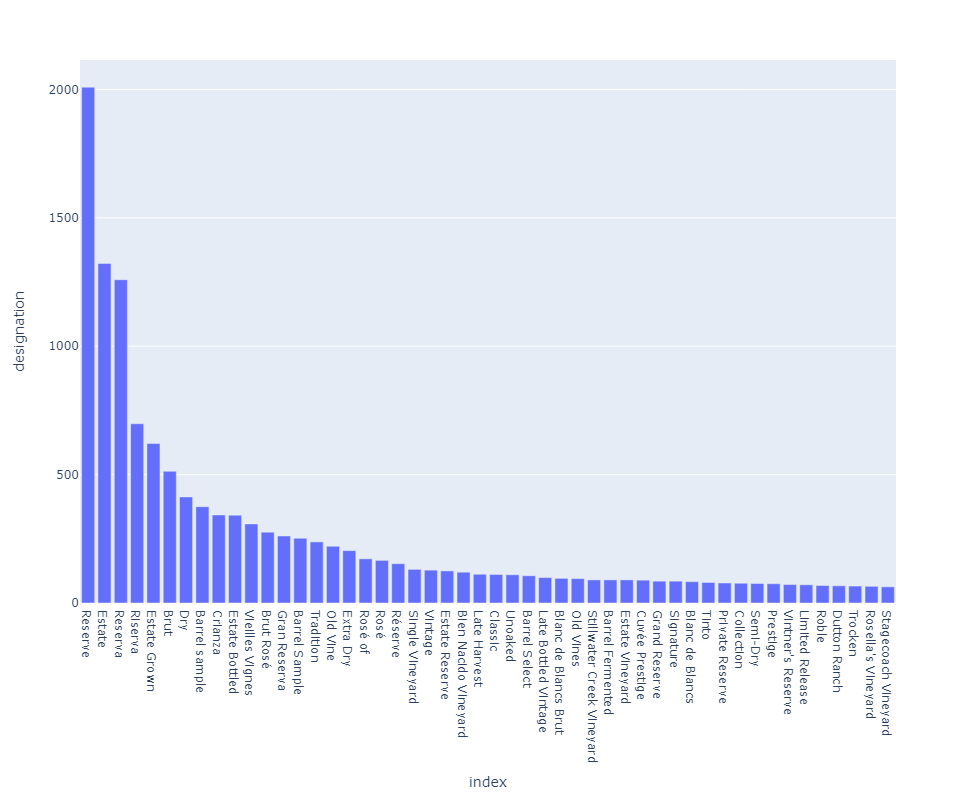

point by designation
price by designation


In [187]:
print(WR['designation'].value_counts())

#sem description 
a=WR.groupby(by=['description'])['designation'].nunique().to_frame().reset_index().sort_values(by='designation',ascending=False)
print(a.head(25))


# sem title
a=WR.groupby(by=['title'])['designation'].nunique().to_frame().reset_index().sort_values(by='designation',ascending=False)
print(a.head(25))


print('Number of observations in each designation')
value_counts_designation=WR.designation.value_counts()
value_counts_designation=value_counts_designation.reset_index()
print(value_counts_designation.iloc[0:50])   
fig=px.bar(value_counts_designation.iloc[0:50], x='index', y='designation', height=800)
fig.show()

print('point by designation')
#summary_points_by_designation=WR.groupby(by=['designation'])['points'].describe().sort_values(by='mean',ascending=False)
#print(summary_points_by_designation)


#fig = px.box(WR, x="designation", y="points")
#fig.show()


print('price by designation')
#summary_price_by_designation=WR.groupby(by=['designation'])['price'].describe().sort_values(by='mean',ascending=False)
#print(summary_price_by_designation)







### variety

Pinot Noir                    13272
Chardonnay                    11753
Cabernet Sauvignon             9472
Red Blend                      8946
Bordeaux-style Red Blend       6915
                              ...  
Cabernet Sauvignon-Barbera        1
Sauvignonasse                     1
Forcallà                          1
Meseguera                         1
Bobal-Cabernet Sauvignon          1
Name: variety, Length: 707, dtype: int64
                                              description  variety
72730   Stalky aromas suggest hay and green herbs, wit...        2
41502   Green bell pepper, red currant and dark spice ...        2
41372   Gravenstein apple, honeysuckle and jasmine aro...        2
81200   The subdued nose eventually reveals black cher...        2
102313  This offers aromas and flavors suggesting unri...        2
17020   Aromas of citrus, melon and orange blossom sta...        2
45525   In 2009 this single vineyard offering includes...        2
81263   The tannins are so 

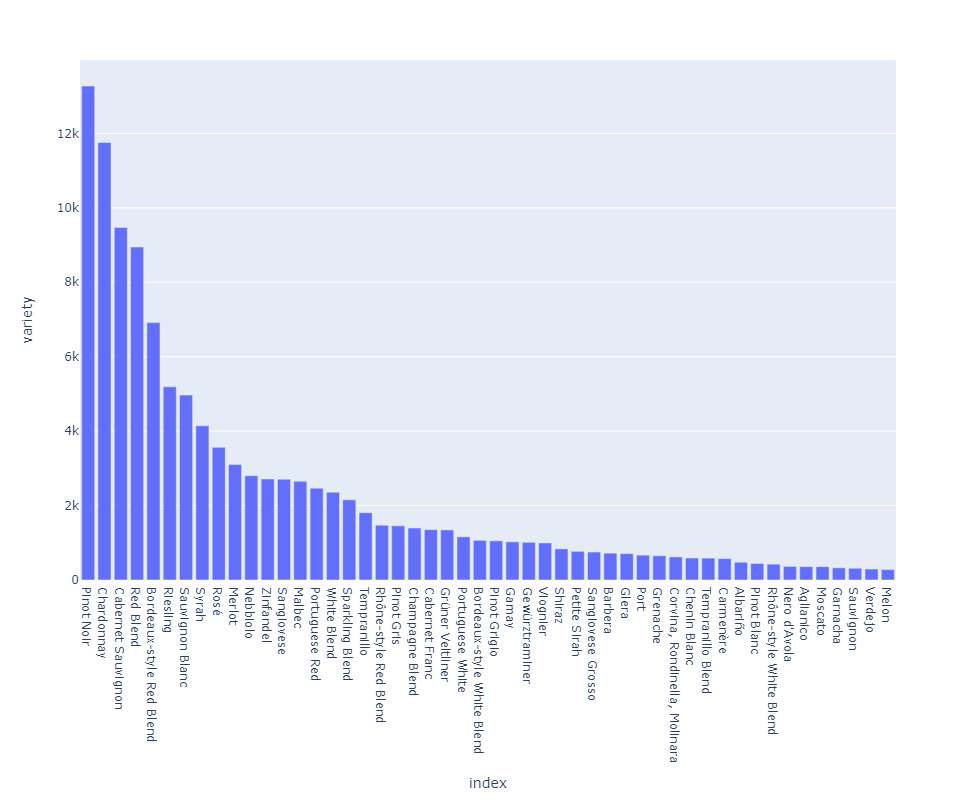

point by variety
price by variety


In [190]:
print(WR['variety'].value_counts())

#sem description 
a=WR.groupby(by=['description'])['variety'].nunique().to_frame().reset_index().sort_values(by='variety',ascending=False)
print(a.head(25))


# sem title
a=WR.groupby(by=['title'])['variety'].nunique().to_frame().reset_index().sort_values(by='variety',ascending=False)
print(a.head(25))



print('Number of observations in each variety')
value_counts_variety=WR.variety.value_counts()
value_counts_variety=value_counts_variety.reset_index()
print(value_counts_variety.iloc[0:50])   
fig=px.bar(value_counts_variety.iloc[0:50], x='index', y='variety', height=800)
fig.show()

print('point by variety')
#summary_points_by_designation=WR.groupby(by=['designation'])['points'].describe().sort_values(by='mean',ascending=False)
#print(summary_points_by_designation)


#fig = px.box(WR, x="designation", y="points")
#fig.show()


print('price by variety')
#summary_price_by_designation=WR.groupby(by=['designation'])['price'].describe().sort_values(by='mean',ascending=False)
#print(summary_price_by_designation)








### winery

Wines & Winemakers    222
Testarossa            218
DFJ Vinhos            215
Williams Selyem       211
Louis Latour          199
                     ... 
Hypothesis              1
Camps d'Estels          1
Harbor Town             1
Château de Saurs        1
Penedo Borges           1
Name: winery, Length: 16757, dtype: int64
                                              description  winery
74105   Subtle aromas of dark berry, tilled earth and ...       2
68259   Sharp, simple and candied, with blackberry jam...       2
110374  This wine shows some of the less appealing asp...       2
45525   In 2009 this single vineyard offering includes...       2
114492  Vibrant and spicy, this savory red delivers ar...       2
26037   Classically structured, this still needs to op...       2
380     90–92. Barrel sample. This is a solid and dens...       2
29677   Delicate aromas of honeysuckle and pear take s...       2
28609   Dark berry, toasted hazelnut and menthol aroma...       2
41502   Gree

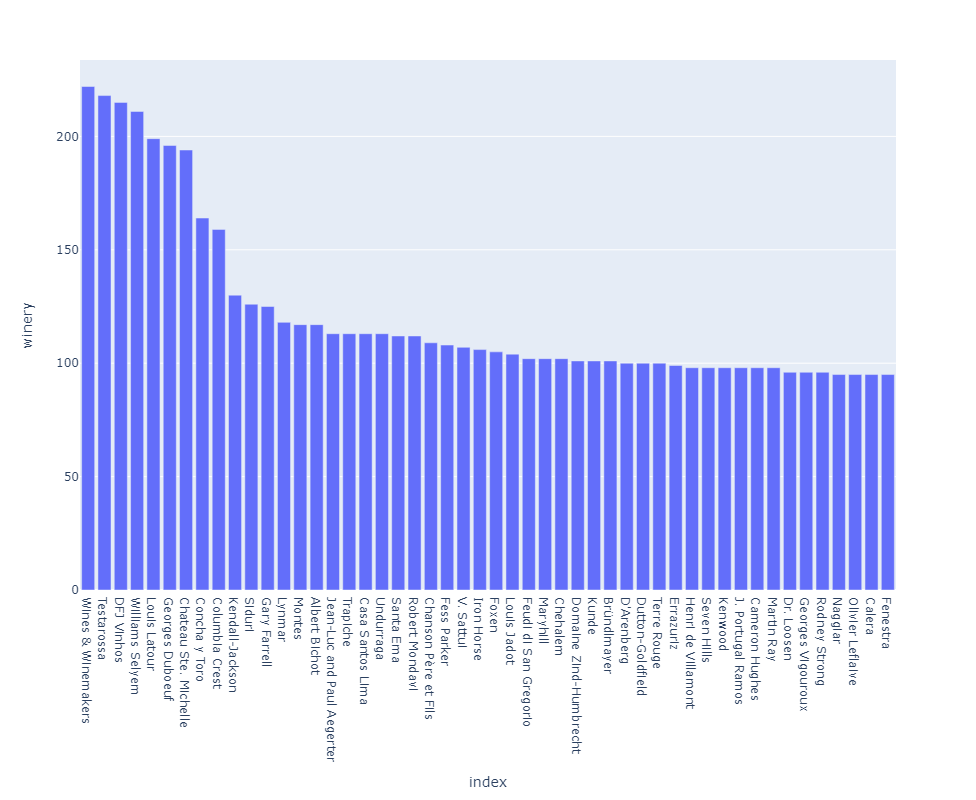

point by variety
price by variety


In [191]:
print(WR['winery'].value_counts())

#sem description 
a=WR.groupby(by=['description'])['winery'].nunique().to_frame().reset_index().sort_values(by='winery',ascending=False)
print(a.head(25))


# sem title
a=WR.groupby(by=['title'])['winery'].nunique().to_frame().reset_index().sort_values(by='winery',ascending=False)
print(a.head(60))


print('Number of observations in each winery')
value_counts_winery=WR.winery.value_counts()
value_counts_winery=value_counts_winery.reset_index()
print(value_counts_winery.iloc[0:50])   
fig=px.bar(value_counts_winery.iloc[0:50], x='index', y='winery', height=800)
fig.show()

print('point by winery')
#summary_points_by_designation=WR.groupby(by=['designation'])['points'].describe().sort_values(by='mean',ascending=False)
#print(summary_points_by_designation)


#fig = px.box(WR, x="designation", y="points")
#fig.show()


print('price by winery
      ')
#summary_price_by_designation=WR.groupby(by=['designation'])['price'].describe().sort_values(by='mean',ascending=False)
#print(summary_price_by_designation)






## country

Number of observations in each country
                     index  country
0                       US    54504
1                   France    22093
2                    Italy    19540
3                    Spain     6645
4                 Portugal     5691
5                    Chile     4472
6                Argentina     3800
7                  Austria     3345
8                Australia     2329
9                  Germany     2165
10             New Zealand     1419
11            South Africa     1401
12                  Israel      505
13                  Greece      466
14                  Canada      257
15                 Hungary      146
16                Bulgaria      141
17                 Romania      120
18                 Uruguay      109
19                  Turkey       90
20                Slovenia       87
21                 Georgia       86
22                 England       74
23                 Croatia       73
24                  Mexico       70
25                 Moldov

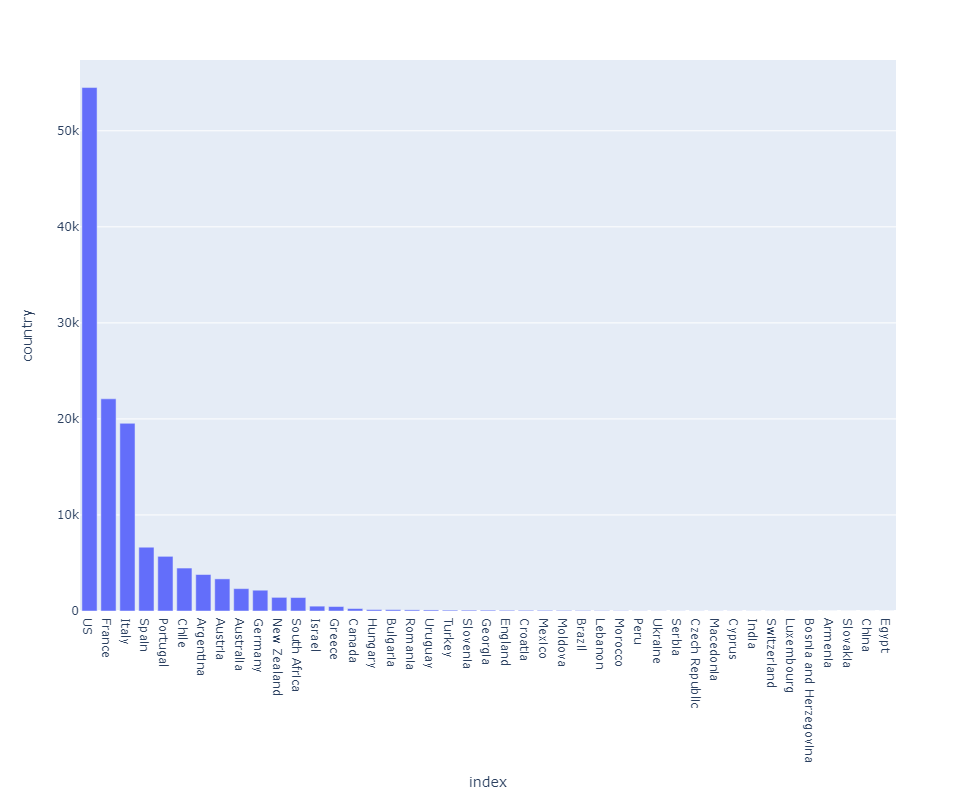

point by country
                          count       mean       std   min    25%   50%  \
country                                                                   
England                    74.0  91.581081  1.843216  89.0  90.00  91.0   
India                       9.0  90.222222  1.715938  87.0  90.00  90.0   
Austria                  3345.0  90.101345  2.499799  82.0  88.00  90.0   
Germany                  2165.0  89.851732  2.469351  81.0  88.00  90.0   
Canada                    257.0  89.369650  2.384752  82.0  88.00  90.0   
Hungary                   146.0  89.191781  2.686659  81.0  88.00  89.0   
China                       1.0  89.000000       NaN  89.0  89.00  89.0   
France                  22093.0  88.845109  3.044423  80.0  87.00  89.0   
Luxembourg                  6.0  88.666667  0.816497  88.0  88.00  88.5   
Australia                2329.0  88.580507  2.989900  80.0  87.00  89.0   
Switzerland                 7.0  88.571429  2.507133  83.0  89.00  89.0   
Morocco 

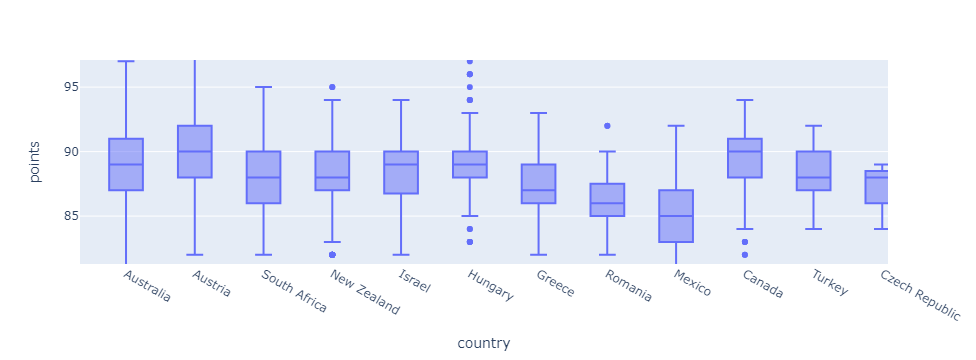

price by country
                          count       mean        std   min    25%   50%  \
country                                                                    
Switzerland                 7.0  85.285714  70.063577  21.0  29.00  38.0   
England                    69.0  51.681159  14.858641  25.0  43.00  50.0   
Germany                  2120.0  42.257547  62.860308   5.0  18.00  26.0   
France                  17776.0  41.139120  73.769404   5.0  16.00  25.0   
Hungary                   145.0  40.648276  69.451075  10.0  19.00  25.0   
Italy                   16914.0  39.663770  38.052479   5.0  18.00  28.0   
US                      54265.0  36.573464  27.088857   4.0  20.00  30.0   
Canada                    254.0  35.712598  19.658148  12.0  21.00  30.0   
Australia                2294.0  35.437663  49.049458   5.0  15.00  21.0   
Israel                    489.0  31.768916  18.898287   8.0  18.00  25.0   
Austria                  2799.0  30.762772  27.224797   7.0  18.00  25.

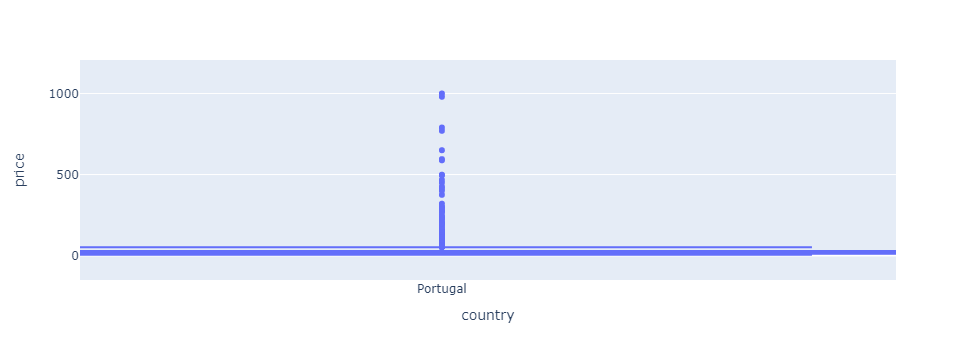

                        province  region_1  region_2
country                                             
Argentina                      2        31         0
Armenia                        1         0         0
Australia                      6        75         0
Austria                       25         0         0
Bosnia and Herzegovina         1         0         0
Brazil                         8         0         0
Bulgaria                       4         0         0
Canada                         3        12         0
Chile                         43         0         0
China                          1         0         0
Croatia                       13         0         0
Cyprus                         6         0         0
Czech Republic                 1         0         0
Egypt                          1         0         0
England                        1         0         0
France                        11       386         0
Georgia                        2         0    

C:\Users\user\AppData\Local\Temp\ipykernel_10740\1817253691.py:27: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



In [39]:
print('Number of observations in each country')
value_counts_country=WR.country.value_counts()
value_counts_country=value_counts_country.reset_index()
print(value_counts_country)   
fig=px.bar(value_counts_country, x='index', y='country', height=800)
fig.show()

print('point by country')
summary_points_by_counntry=WR.groupby(by=['country'])['points'].describe().sort_values(by='mean',ascending=False)
print(summary_points_by_counntry)


fig = px.box(WR, x="country", y="points")
fig.show()


print('price by country')
summary_price_by_counntry=WR.groupby(by=['country'])['price'].describe().sort_values(by='mean',ascending=False)
print(summary_price_by_counntry)

fig = px.box(WR, x="country", y="price")
fig.show()



# summary  province	region_1,region_2
summary_zoon=WR.groupby(by=['country'])['province','region_1','region_2'].nunique()
print(summary_zoon)




# Preprocessing

In [4]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn import set_config
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer




In [ ]:
X_train, X_test, y_train, y_test = train_test_split(titanic_X, titanic_y, test_size=0.2, random_state=42)


# Define categorical and numerical features
categorical_features = ['Sex', 'Embarked']
numerical_features = ['Pclass', 'Age', 'SibSp', 'Parch', 'Fare']

# Create categorical and numerical transformers
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
])

numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])

# Combine transformers using ColumnTransformer
titanic_preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features),
        ('cat', categorical_transformer, categorical_features)
], remainder='drop')
